In [1]:
import numpy as np
from matplotlib import animation
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd
from IPython.display import HTML
from qwanta import Experiment
import matplotlib
import seaborn as sns

## Architecture type
- 0: Next photon wait for classical message of previous one and processing each process one at a time.
- 1: Pulse emittion and processing each process one at a time.
- 2: Pulse emittion and processing process in parallel.

## Experiment setup for each Architecture type
-  ID9-StaticLink: 

In [2]:
## Architype 2

def time_to_coordinate(t):
    return (50*np.sin((7/50)*t) + 100,0,0) #(90 + 7*t,0,0)

def time_to_coordinate_inv(t):
    return (-1*50*np.sin((7/50)*t) + 100,0,0)

def distance_to_prob(distance, time):
    p = [1, 0, 0, 0]
    return p

node_number = 3
n_hops = [2]
nodes_name = [f'Node {i}' for i in range(node_number)]
distance_btw = 100 # km
#nodes_coordinate = [(0, 0), (1000, 0), (2200, 0), (3600, 0), (5200, 0)]
edges_loss = [0]*(node_number-1) # dB/km

nodes_info_exp = [{
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (100, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (50, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 40,
            'numInternalEncodingBuffer': 40,
            'numInternalDetectingBuffer': 20,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate_inv},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
]
edges_info_exp = [
    {
        ('Node 0', 'Node 1'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': 0,
        'light speed': 300000,
        'Pulse rate': 0.0001,
        },
        ('Node 1', 'Node 2'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': 0,
        'light speed': 300000,
        'Pulse rate': 0.0001,
        }
    }
for _ in nodes_info_exp]

e_tl, vis_a = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_1setup_ArcType2.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx
e_tl_2, vis_b = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_2setup_ArcType2.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx

timelines = {'ID9-StaticMiddleLink': e_tl, 'ID9-StaticBiasLeftLink': e_tl,'ID9-DynamicMiddleLink': e_tl,'ID9-DynamicMiddleLinkDouble': e_tl_2,'ID9-DynamicMiddleLink-inverseDirection': e_tl}
nodes_information = {'ID9-StaticMiddleLink': nodes_info_exp[0], 'ID9-StaticBiasLeftLink': nodes_info_exp[1],'ID9-DynamicMiddleLink': nodes_info_exp[2],'ID9-DynamicMiddleLinkDouble': nodes_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': nodes_info_exp[4]}
networks = {'ID9-StaticMiddleLink': edges_info_exp[0], 'ID9-StaticBiasLeftLink': edges_info_exp[1],'ID9-DynamicMiddleLink': edges_info_exp[2],'ID9-DynamicMiddleLinkDouble': edges_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': edges_info_exp[4]}
mem_func = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
sim_time = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
labels ={'ID9-StaticMiddleLink': 'k', 'ID9-StaticBiasLeftLink': 'k','ID9-DynamicMiddleLink': 'k','ID9-DynamicMiddleLinkDouble': 'k','ID9-DynamicMiddleLink-inverseDirection': 'k'}

e_tl[-1]['Num Trials'] = 9000
exp_names = ['ID9-StaticMiddleLink', 'ID9-StaticBiasLeftLink','ID9-DynamicMiddleLink','ID9-DynamicMiddleLinkDouble', 'ID9-DynamicMiddleLink-inverseDirection']

In [3]:
vis_b

,Main Process,Edges,Num Trials,Label in,Label out,Resource Type,Protocol
0,PrototypeGeneratePhysicalResourcePulse,"[Node 0, Node 1]",True,Physical Qubit,Physical,NaN,NaN
1,PrototypeGeneratePhysicalResourcePulse,"[Node 0, Node 1]",True,Physical Qubit,Physical,NaN,NaN
2,PrototypeGeneratePhysicalResourcePulse,"[Node 1, Node 2]",True,Physical Qubit,Physical,NaN,NaN
3,PrototypeGeneratePhysicalResourcePulse,"[Node 1, Node 2]",True,Physical Qubit,Physical,NaN,NaN
4,PrototypeGenerateLogicalResource,"[Node 0, Node 1]",True,Physical,Logical,Physical,Non-local CNOT
5,PrototypeGenerateLogicalResource,"[Node 1, Node 2]",True,Physical,Logical,Physical,Non-local CNOT
6,PrototypeEntanglementSwapping,"[Node 0, Node 1, Node 2]",True,Logical,k,Logical,NaN
7,PrototypeStateTomography,"[Node 0, Node 2]",9000,k,Physical Qubit,Logical,NaN


In [34]:
p = [0]
exper_architecture2 = Experiment(networks, timelines, nodes_info=nodes_information, memFunc=mem_func, simTime=sim_time,
                 photon_channel=p, collect_fidelity_history=False, repeat=1,
                 label_records=labels,path='exp_ID9', message_log='exp_ID9_ArcType2_zero_loss', progress_bar=True)
#exper_architecture2.run()

Experiments executed:   0%|          | 0/5 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
time_architecture2 = exper_architecture2.results()['ID9-StaticMiddleLink'][0][0]['Simulation log']
frame_len = len(time_architecture2)
df_time = pd.DataFrame(time_architecture2)
df_time

,Time,Message
0,0.000000,Send connection request from Node 0 to Node 2
1,0.000667,Return RuleSet request from Node 2 to Node 0
2,0.001333,Process RuleSet of Node 0 and Node 2
3,0.002000,Qubit (Node 0-0) entangle with Qubit (Node 1-0)
4,0.002000,Qubit (Node 1-0) entangle with Qubit (Node 2-0)
...,...,...
153035,6.303500,Qubit (Node 0-15) entangle with Qubit (Node 1-15)
153036,6.303500,Qubit (Node 1-15) entangle with Qubit (Node 2-15)
153037,6.303600,Qubit (Node 0-16) entangle with Qubit (Node 1-16)
153038,6.303600,Qubit (Node 1-16) entangle with Qubit (Node 2-16)


[0.001 0.001 0.001]
[0.0015 0.0015 0.0015]
[0.00159287 0.00159287 0.00159287]
[0.00125345 0.00125345 0.00125345]
[0.00122291 0.00122291 0.00122291]


([<matplotlib.axis.XTick at 0x2322f2da470>,
 [Text(1, 0, 'ID9-StaticMiddleLink'),
  Text(2, 0, 'ID9-StaticBiasLeftLink'),
  Text(3, 0, 'ID9-DynamicMiddleLink'),
  Text(4, 0, 'ID9-DynamicMiddleLinkDouble'),
  Text(5, 0, 'ID9-DynamicMiddleLink-inverseDirection')])

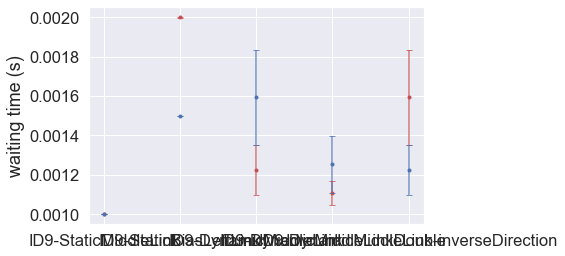

In [55]:
plt.figure()

for exp_num, exp_name in enumerate(exp_names):
    wt_list_left = []
    wt_list_right = []
    for qs in exper_architecture2.results()[exp_name][0][0]['Qubits waiting time']:
        qubits_left = qs['Node 0']
        qubits_right = qs[f'Node 2']

        # Average of every qubit in the encoded ?
        # all_qubit = qubits_left + qubits_right
        mean_qubit_wt_left, mean_qubit_wt_right = np.mean(qubits_left), np.mean(qubits_right)
        # Max/Min waiting time qubit
        max_qubit_wt_left, min_qubit_wt_left = np.mean(max(qubits_left)), np.mean(min(qubits_left))
        max_qubit_wt_right, min_qubit_wt_right = np.mean(max(qubits_right)), np.mean(min(qubits_right))

        wt_list_left.append([min_qubit_wt_left, mean_qubit_wt_left, max_qubit_wt_left])
        wt_list_right.append([min_qubit_wt_right, mean_qubit_wt_right, max_qubit_wt_right])
    wt_list_left = np.array(wt_list_left)
    wt_list_right = np.array(wt_list_right)
    mean_left, std_left = np.mean(wt_list_left, axis=0), np.std(wt_list_left, axis=0)
    mean_right, std_right = np.mean(wt_list_right, axis=0), np.std(wt_list_right, axis=0)
    plt.plot(exp_num+1, mean_left[1], 'r.' ,label='left')
    plt.errorbar(exp_num+1, mean_left[1], ecolor='r', yerr=std_left[1], alpha=.75, fmt=':', capsize=3, capthick=1)
    plt.errorbar(exp_num+1, mean_right[1], ecolor='b', yerr=std_right[1], alpha=.75, fmt=':', capsize=3, capthick=1)
    print(mean_right)
    plt.plot(exp_num+1, mean_right[1], 'b.', label='right')
    #plt.legend()
plt.ylabel('waiting time (s)')
plt.xticks(range(1, len(exp_names)+1), exp_names)

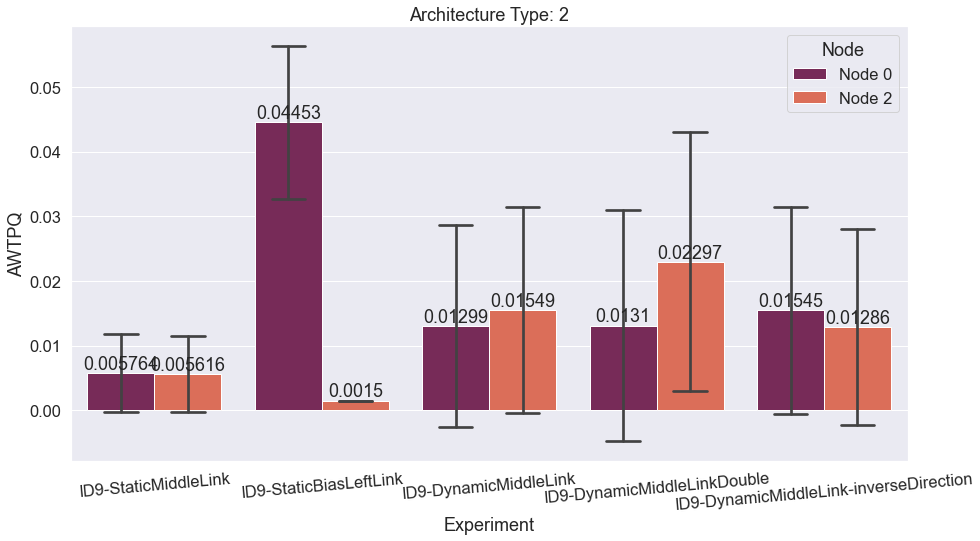

In [25]:
# AWTPQ = Average waiting time of each physical qubit encoded to logical qubit
col_name = {'AWTPQ ', 'Node', 'index', 'Experiment'}
experiemnt_results = exper_architecture2.results()
data_list = []
for exp_num, exp_name in enumerate(exp_names):
    for index in range(9000):
        all_mean_qubit_wt_left, all_mean_qubit_wt_right, time = [], [], []
        for repeat in range(1):
            qubits_left = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 0']
            qubits_right = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 2']

            mean_qubit_wt_left, mean_qubit_wt_right = np.mean(qubits_left), np.mean(qubits_right)
            all_mean_qubit_wt_left.append(mean_qubit_wt_left)
            all_mean_qubit_wt_right.append(mean_qubit_wt_right)
            time.append(experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Time'])

        all_mean_time = np.mean(time)
        all_mean_left, all_mean_right = np.mean(all_mean_qubit_wt_left), np.mean(all_mean_qubit_wt_right)
        tmp_left = {'Experiment':exp_name, 'AWTPQ': all_mean_left, 'Node': 'Node 0', 'index':index, 'Time':all_mean_time}
        tmp_right = {'Experiment':exp_name, 'AWTPQ': all_mean_right, 'Node': 'Node 2', 'index':index, 'Time':all_mean_time}
        data_list.append(tmp_left)
        data_list.append(tmp_right)

dataset_architecture2 = pd.DataFrame(data_list)
dataset_architecture2

plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture2, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket", capsize=0.2)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4}',
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center',
                   xytext=(0, 9),
                   textcoords='offset points')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
#ax.set_ylim(0, 0.02)
ax.set_title('Architecture Type: 2')
#plt.savefig('exp_id9/exp_id9_architype2_noLoss.png')

df = dataset_architecture2
dummy = []
for name in exp_names:
    first_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].head(1).iloc[0]['Time']
    last_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].tail(1).iloc[0]['Time']
    dummy.append([first_mean, last_mean])
    #first = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].head(1)
    #last = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].tail(1)
    #print(f'{name}: first: {first}, last: {last}')
np.savetxt('exp_id9/exp_id9_a2_no_loss.csv', np.array(dummy), delimiter=",")

In [29]:
df = dataset_architecture2
arc = ['Architecture 2']*len(df)
df['Architecture'] = arc
df.to_csv('exp_id9/exp_id9_arch2_noloss_results_df.csv')

In [60]:
len(exper_architecture2.results()['ID9-DynamicMiddleLink'][0][0]['Qubits waiting time'])

9001

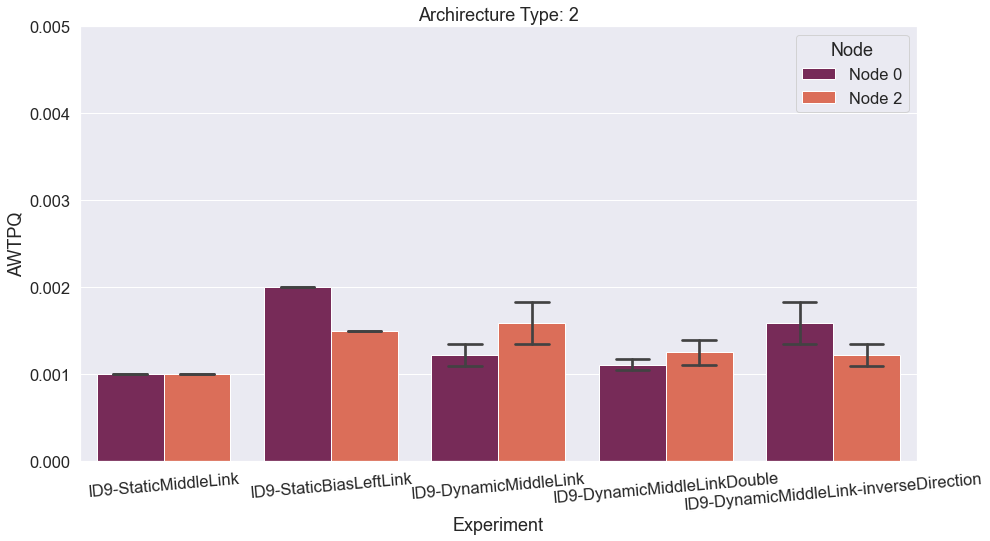

In [88]:
plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture2, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket" ,capsize=0.2)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
ax.set_ylim(0, 0.005)
ax.set_title('Archirecture Type: 2')
plt.savefig('exp_id9/exp_id9_architype2_focus.png')

In [7]:
# Architecture 1

def time_to_coordinate(t):
    return (50*np.sin((7/50)*t) + 100,0,0) #(90 + 7*t,0,0)

def time_to_coordinate_inv(t):
    return (-1*50*np.sin((7/50)*t) + 100,0,0)

def distance_to_prob(distance, time):
    p = [1, 0, 0, 0]
    return p

node_number = 3
n_hops = [2]
nodes_name = [f'Node {i}' for i in range(node_number)]
distance_btw = 100 # km
#nodes_coordinate = [(0, 0), (1000, 0), (2200, 0), (3600, 0), (5200, 0)]
edges_loss = [0]*(node_number-1) # dB/km

nodes_info_exp = [{
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (100, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (50, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 40,
            'numInternalEncodingBuffer': 40,
            'numInternalDetectingBuffer': 20,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate_inv},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
]
edges_info_exp = [
    {
        ('Node 0', 'Node 1'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': edges_loss[0],
        'light speed': 300000,
        'Pulse rate': 0.0001,
        },
        ('Node 1', 'Node 2'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': edges_loss[1],
        'light speed': 300000,
        'Pulse rate': 0.0001,
        }
    }
for _ in nodes_info_exp]

e_tl, vis_a = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_1setup_ArcType1.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx
e_tl_2, vis_b = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_2setup_ArcType1.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx

timelines = {'ID9-StaticMiddleLink': e_tl, 'ID9-StaticBiasLeftLink': e_tl,'ID9-DynamicMiddleLink': e_tl,'ID9-DynamicMiddleLinkDouble': e_tl_2,'ID9-DynamicMiddleLink-inverseDirection': e_tl}
nodes_information = {'ID9-StaticMiddleLink': nodes_info_exp[0], 'ID9-StaticBiasLeftLink': nodes_info_exp[1],'ID9-DynamicMiddleLink': nodes_info_exp[2],'ID9-DynamicMiddleLinkDouble': nodes_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': nodes_info_exp[4]}
networks = {'ID9-StaticMiddleLink': edges_info_exp[0], 'ID9-StaticBiasLeftLink': edges_info_exp[1],'ID9-DynamicMiddleLink': edges_info_exp[2],'ID9-DynamicMiddleLinkDouble': edges_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': edges_info_exp[4]}
mem_func = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
sim_time = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
labels ={'ID9-StaticMiddleLink': 'k', 'ID9-StaticBiasLeftLink': 'k','ID9-DynamicMiddleLink': 'k','ID9-DynamicMiddleLinkDouble': 'k','ID9-DynamicMiddleLink-inverseDirection': 'k'}

e_tl[-1]['Num Trials'] = 9000
exp_names = ['ID9-StaticMiddleLink', 'ID9-StaticBiasLeftLink','ID9-DynamicMiddleLink','ID9-DynamicMiddleLinkDouble', 'ID9-DynamicMiddleLink-inverseDirection']

In [8]:
p = [1]
exper_architecture1 = Experiment(networks, timelines, nodes_info=nodes_information, memFunc=mem_func, simTime=sim_time,
                 photon_channel=p, collect_fidelity_history=False, repeat=1,
                 label_records=labels,path='exp_ID9', message_log='exp_ID9_ArcType1_zero_loss', progress_bar=True)
exper_architecture1.run()

Experiments executed:   0%|          | 0/5 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

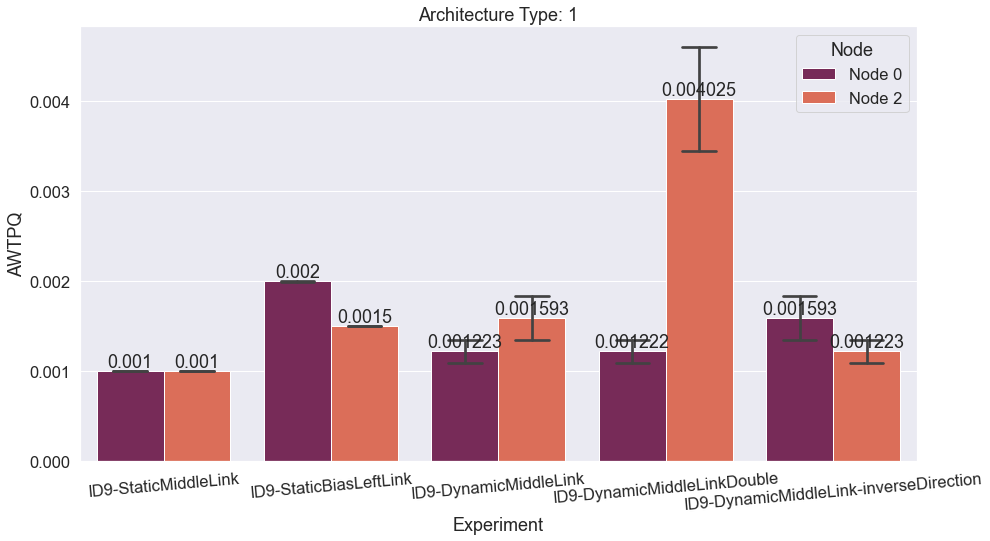

In [28]:
# AWTPQ = Average waiting time of each physical qubit encoded to logical qubit
col_name = {'AWTPQ ', 'Node', 'index', 'Experiment'}
experiemnt_results = exper_architecture1.results()
data_list = []
for exp_num, exp_name in enumerate(exp_names):
    for index in range(9000):
        all_mean_qubit_wt_left, all_mean_qubit_wt_right, time = [], [], []
        for repeat in range(1):
            qubits_left = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 0']
            qubits_right = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 2']

            mean_qubit_wt_left, mean_qubit_wt_right = np.mean(qubits_left), np.mean(qubits_right)
            all_mean_qubit_wt_left.append(mean_qubit_wt_left)
            all_mean_qubit_wt_right.append(mean_qubit_wt_right)
            time.append(experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Time'])

        all_mean_time = np.mean(time)
        all_std_time = np.std(time)
        all_mean_left, all_mean_right = np.mean(all_mean_qubit_wt_left), np.mean(all_mean_qubit_wt_right)
        tmp_left = {'Experiment':exp_name, 'AWTPQ': all_mean_left, 'Node': 'Node 0', 'index':index, 'Time':all_mean_time, 'STD': all_std_time}
        tmp_right = {'Experiment':exp_name, 'AWTPQ': all_mean_right, 'Node': 'Node 2', 'index':index, 'Time':all_mean_time, 'STD': all_std_time}
        data_list.append(tmp_left)
        data_list.append(tmp_right)

dataset_architecture1 = pd.DataFrame(data_list)
dataset_architecture1

plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture1, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket", capsize=0.2)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4}',
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center',
                   xytext=(0, 9),
                   textcoords='offset points')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
#ax.set_ylim(0, 0.02)
ax.set_title('Architecture Type: 1')
#plt.savefig('exp_id9/exp_id9_architype1_noLoss.png')

df = dataset_architecture1
dummy = []
for name in exp_names:
    first_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].head(1).iloc[0]['Time']
    last_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].tail(1).iloc[0]['Time']
    dummy.append([first_mean, last_mean])
    #first = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].head(1)
    #last = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].tail(1)
    #print(f'{name}: first: {first}, last: {last}')
np.savetxt('exp_id9/exp_id9_a1_no_loss.csv', np.array(dummy), delimiter=",")

In [30]:
df = dataset_architecture1
arc = ['Architecture 1']*len(df)
df['Architecture'] = arc
df.to_csv('exp_id9/exp_id9_arch1_noloss_results_df.csv')

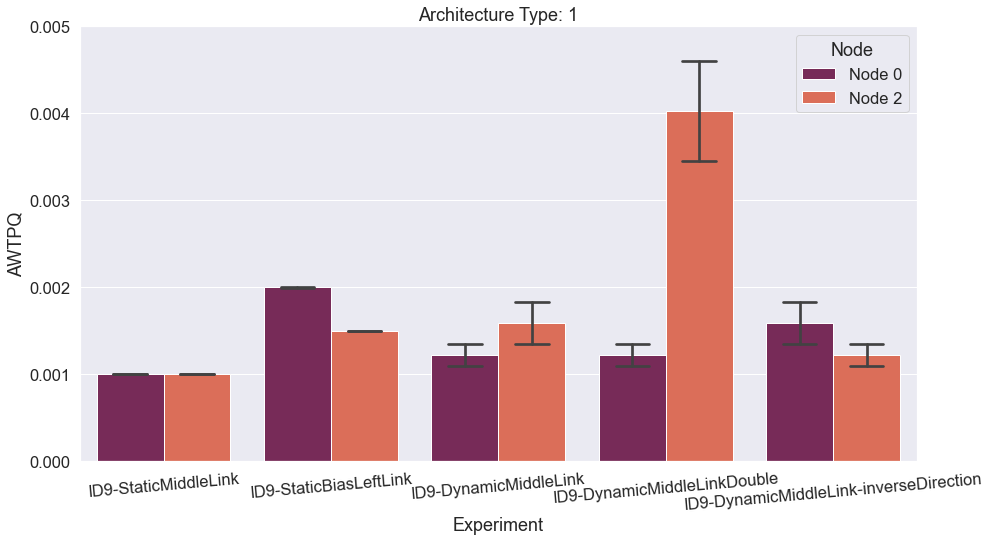

In [87]:
plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture1, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket", capsize=0.2)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
ax.set_ylim(0, 0.005)
ax.set_title('Architecture Type: 1')
plt.savefig('exp_id9/exp_id9_architype1_focus.png')

In [12]:
# Architecture 0

def time_to_coordinate(t):
    return (50*np.sin((7/50)*t) + 100,0,0) #(90 + 7*t,0,0)

def time_to_coordinate_inv(t):
    return (-1*50*np.sin((7/50)*t) + 100,0,0)

def distance_to_prob(distance, time):
    p = [1, 0, 0, 0]
    return p

node_number = 3
n_hops = [2]
nodes_name = [f'Node {i}' for i in range(node_number)]
distance_btw = 100 # km
#nodes_coordinate = [(0, 0), (1000, 0), (2200, 0), (3600, 0), (5200, 0)]
edges_loss = [0]*(node_number-1) # dB/km

nodes_info_exp = [{
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (100, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': (50, 0, 0)},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 40,
            'numInternalEncodingBuffer': 40,
            'numInternalDetectingBuffer': 20,
            'numInternalInterfaceBuffer': 2,
        },
        {  
            'Node 0': {'coordinate': (0, 0, 0)},
            'Node 1': {'coordinate': time_to_coordinate_inv},
            'Node 2': {'coordinate': (200, 0, 0)},
            'numPhysicalBuffer': 20,
            'numInternalEncodingBuffer': 20,
            'numInternalDetectingBuffer': 10,
            'numInternalInterfaceBuffer': 2,
        },
]
edges_info_exp = [
    {
        ('Node 0', 'Node 1'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': edges_loss[0],
        'light speed': 300000,
        'Pulse rate': 0.0001,
        },
        ('Node 1', 'Node 2'): {
        'connection-type': 'Space',
        'function': distance_to_prob,
        'loss': edges_loss[1],
        'light speed': 300000,
        'Pulse rate': 0.0001,
        }
    }
for _ in nodes_info_exp]

e_tl, vis_a = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_1setup_ArcType0.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx
e_tl_2, vis_b = Experiment.read_timeline_from_csv(f'exper_ID9_2hops_2setup_ArcType0.xlsx', excel=True) # exper_id7_Logical_{i}hops.xlsx

timelines = {'ID9-StaticMiddleLink': e_tl, 'ID9-StaticBiasLeftLink': e_tl,'ID9-DynamicMiddleLink': e_tl,'ID9-DynamicMiddleLinkDouble': e_tl_2,'ID9-DynamicMiddleLink-inverseDirection': e_tl}
nodes_information = {'ID9-StaticMiddleLink': nodes_info_exp[0], 'ID9-StaticBiasLeftLink': nodes_info_exp[1],'ID9-DynamicMiddleLink': nodes_info_exp[2],'ID9-DynamicMiddleLinkDouble': nodes_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': nodes_info_exp[4]}
networks = {'ID9-StaticMiddleLink': edges_info_exp[0], 'ID9-StaticBiasLeftLink': edges_info_exp[1],'ID9-DynamicMiddleLink': edges_info_exp[2],'ID9-DynamicMiddleLinkDouble': edges_info_exp[3],'ID9-DynamicMiddleLink-inverseDirection': edges_info_exp[4]}
mem_func = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
sim_time = {'ID9-StaticMiddleLink': None, 'ID9-StaticBiasLeftLink': None,'ID9-DynamicMiddleLink': None,'ID9-DynamicMiddleLinkDouble': None,'ID9-DynamicMiddleLink-inverseDirection': None}
labels ={'ID9-StaticMiddleLink': 'k', 'ID9-StaticBiasLeftLink': 'k','ID9-DynamicMiddleLink': 'k','ID9-DynamicMiddleLinkDouble': 'k','ID9-DynamicMiddleLink-inverseDirection': 'k'}

e_tl[-1]['Num Trials'] = 9000
exp_names = ['ID9-StaticMiddleLink', 'ID9-StaticBiasLeftLink','ID9-DynamicMiddleLink','ID9-DynamicMiddleLinkDouble', 'ID9-DynamicMiddleLink-inverseDirection']

In [13]:
p = [1]
exper_architecture0 = Experiment(networks, timelines, nodes_info=nodes_information, memFunc=mem_func, simTime=sim_time,
                 photon_channel=p, collect_fidelity_history=False, repeat=1,
                 label_records=labels,path='exp_ID9', message_log='exp_ID9_ArcType0_zero_loss', progress_bar=True)
exper_architecture0.run()

Experiments executed:   0%|          | 0/5 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

Parameters executed:   0%|          | 0/1 [00:00<?, ?it/s]

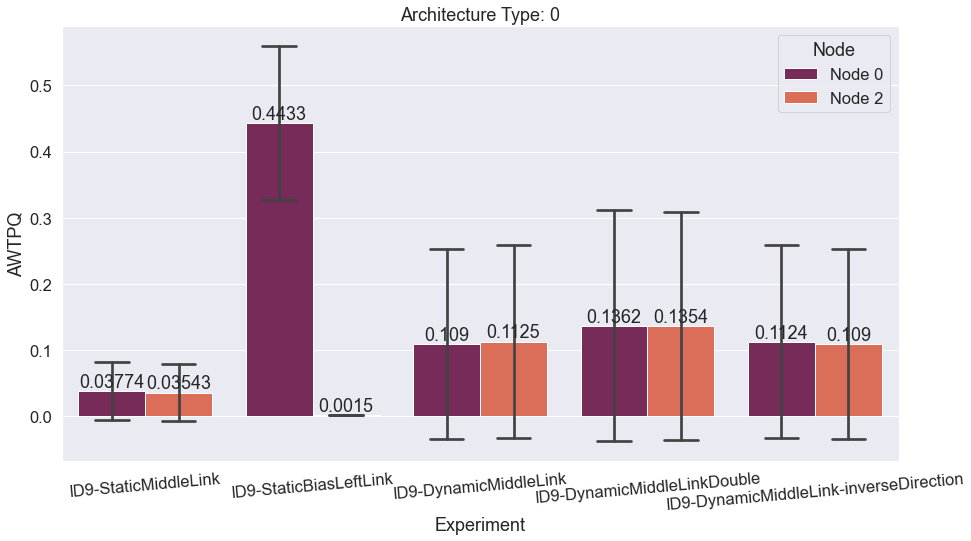

In [27]:
# AWTPQ = Average waiting time of each physical qubit encoded to logical qubit
col_name = {'AWTPQ ', 'Node', 'index', 'Experiment'}
experiemnt_results = exper_architecture0.results()
data_list = []
for exp_num, exp_name in enumerate(exp_names):
    for index in range(9000):
        all_mean_qubit_wt_left, all_mean_qubit_wt_right, time = [], [], []
        for repeat in range(1):
            qubits_left = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 0']
            qubits_right = experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Node 2']

            mean_qubit_wt_left, mean_qubit_wt_right = np.mean(qubits_left), np.mean(qubits_right)
            all_mean_qubit_wt_left.append(mean_qubit_wt_left)
            all_mean_qubit_wt_right.append(mean_qubit_wt_right)
            time.append(experiemnt_results[exp_name][0][repeat]['Qubits waiting time'][index]['Time'])

        all_mean_time = np.mean(time)
        all_std_time = np.std(time)
        all_mean_left, all_mean_right = np.mean(all_mean_qubit_wt_left), np.mean(all_mean_qubit_wt_right)
        tmp_left = {'Experiment':exp_name, 'AWTPQ': all_mean_left, 'Node': 'Node 0', 'index':index, 'Time':all_mean_time, 'STD': all_std_time}
        tmp_right = {'Experiment':exp_name, 'AWTPQ': all_mean_right, 'Node': 'Node 2', 'index':index, 'Time':all_mean_time, 'STD': all_std_time}
        data_list.append(tmp_left)
        data_list.append(tmp_right)

dataset_architecture0 = pd.DataFrame(data_list)
dataset_architecture0

plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture0, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket", capsize=0.2)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4}',
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center',
                   xytext=(0, 9),
                   textcoords='offset points')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
#ax.set_ylim(0, 0.02)
ax.set_title('Architecture Type: 0')
#plt.savefig('exp_id9/exp_id9_architype0_noLoss.png')

df = dataset_architecture0
dummy = []
for name in exp_names:
    first_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].head(1).iloc[0]['Time']
    last_mean = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')][['Time']].tail(1).iloc[0]['Time']
    dummy.append([first_mean, last_mean])
    #first = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].head(1)
    #last = df.loc[(df['Experiment'] == name) & (df['Node'] == 'Node 0')]['Time'].tail(1)
    #print(f'{name}: first: {first}, last: {last}')
np.savetxt('exp_id9/exp_id9_a0_no_loss.csv', np.array(dummy), delimiter=",")

In [31]:
df = dataset_architecture0
arc = ['Architecture 0']*len(df)
df['Architecture'] = arc
df.to_csv('exp_id9/exp_id9_arch0_noloss_results_df.csv')

In [109]:
groupedvalues = dataset_architecture0.groupby(['Experiment']).mean().reset_index()
groupedvalues.head()

,Experiment,AWTPQ,index
0,ID9-DynamicMiddleLink,0.110676,4499.5
1,ID9-DynamicMiddleLink-inverseDirection,0.111085,4499.5
2,ID9-DynamicMiddleLinkDouble,0.136238,8999.5
3,ID9-StaticBiasLeftLink,0.221256,4499.5
4,ID9-StaticMiddleLink,0.037635,4499.5


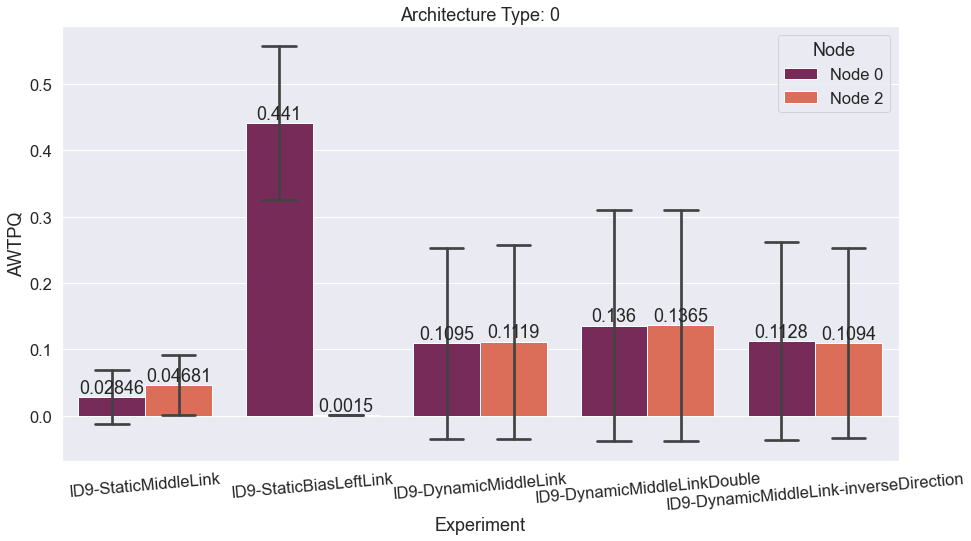

In [113]:
plt.figure(figsize = (15,8))
sns.set(font_scale = 1.5)
ax = sns.barplot(data=dataset_architecture0, x='Experiment', y='AWTPQ', hue='Node', ci='sd',palette="rocket", capsize=0.2)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 5)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4}',
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center',
                   xytext=(0, 9),
                   textcoords='offset points')
#ax.set_ylim(0, 0.02)
ax.set_title('Architecture Type: 0')
plt.savefig('exp_id9/exp_id9_architype0_loss.png')

In [112]:
format(0.00002, )

'2e-05'

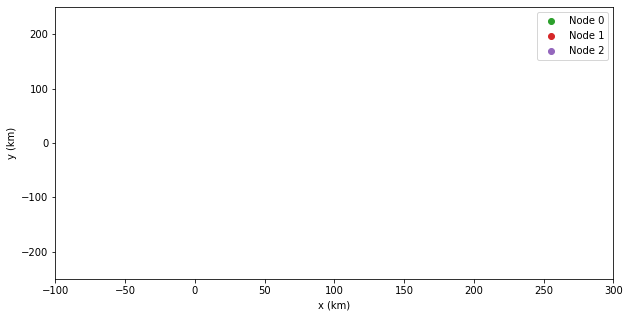

In [66]:
# Mock time test
time = [
    {
        "Time": i,
        "Message": 0
    }
for i in np.linspace(0, 80, 500)]
frame_len = len(time)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
 
# set limit for x and y axis
axes.set_ylim(-250, 250)
axes.set_xlim(-100, 300)

axes.set_ylabel('y (km)')
axes.set_xlabel('x (km)')

edges = [axes.plot([], [], '-') for _ in range(len(edges_info_exp[0]))]
nodes = [axes.plot([], [], 'o', label=f'{node}') for node in nodes_info_exp]

time_text = axes.text(0.02, 0.93, '', transform=axes.transAxes)

axes.legend()

def init():

    global nodes, edges, time_text

    for node in nodes:
        node[0].set_data([], [])

    for edge in edges:
        edge[0].set_data([], [])

    time_text.set_text('')

    tmp = tuple(nodes + edges + [time_text])
    
    return tmp

def animate(i, nodes_info, edges_info, time, nodes, edges, time_text):

    lat_list = {}
    lon_list = {}

    for node, node_axes in zip(nodes_info, nodes):

        lat = nodes_info[node]['coordinate'](time[i]['Time'])[0] if callable(nodes_info[node]['coordinate']) else nodes_info[node]['coordinate'][0]
        lon = nodes_info[node]['coordinate'](time[i]['Time'])[1] if callable(nodes_info[node]['coordinate']) else nodes_info[node]['coordinate'][1]

        lat_list[node] = lat
        lon_list[node] = lon

        node_axes[0].set_data([lat], [lon])

    for edge, edge_axes in zip(edges_info, edges):
        
        lat_1 = lat_list[edge[0]]
        lon_1 = lon_list[edge[0]]

        lat_2 = lat_list[edge[1]]
        lon_2 = lon_list[edge[1]]

        edge_axes[0].set_data([lat_1, lat_2], [lon_1, lon_2])

    time_text.set_text(f'time: {time[i]["Time"]} s, Message: {time[i]["Message"]}')

    tmp = tmp = tuple(nodes + edges + [time_text])

    return tmp

ani = FuncAnimation(fig, animate, init_func=init,
                    frames=frame_len, interval=1, fargs=(nodes_info_exp, edges_info_exp[0], time, nodes, edges, time_text))


In [67]:
ani.save('ID9-DynamicLink_trajectory.mp4', fps=20)
HTML(ani.to_jshtml())

Text(0.5, 1.0, 'loss 0.1 (dB/km)')

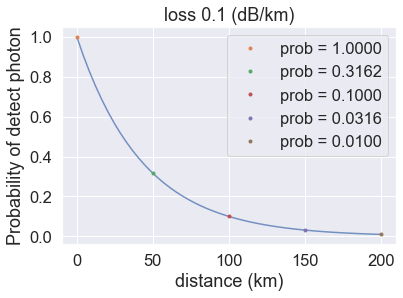

In [117]:
# loss in dB/km

loss_in_fiber = 0.1 # dB/km
distance = np.linspace(0, 200, 50)

# dB is -10log(I/I0) -> I/I0 is prob ?
def prob(distance, loss_in_fiber):
    return 1/(10**(loss_in_fiber*distance/10))
interest_x = np.array([0, 50, 100, 150, 200])
interest_y = prob(interest_x, loss_in_fiber)
plt.plot(distance, prob(distance, loss_in_fiber), alpha=0.75)

for x, y in zip(interest_x, interest_y):
    plt.plot(x, y, '.', label=f'prob = {y:.4f}')

plt.legend()
plt.ylabel('Probability of detect photon')
plt.xlabel('distance (km)')
plt.title(f'loss {loss_in_fiber} (dB/km)')